<h2><b>SIFT</b></h2><br>

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

figsize = (10, 10)

def show_image(img, title):
    plt.imshow(img)
    plt.title(title)
    plt.show()

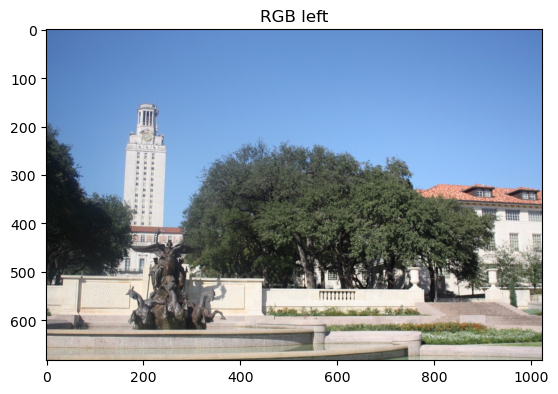

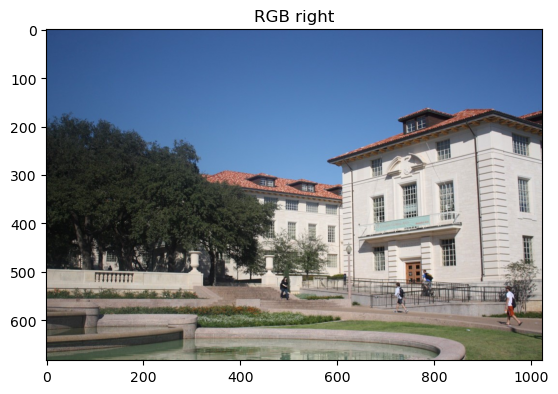

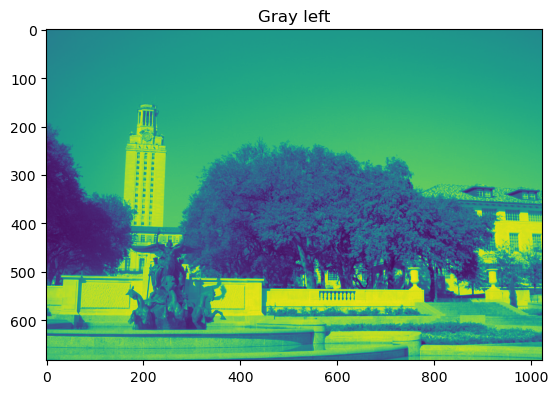

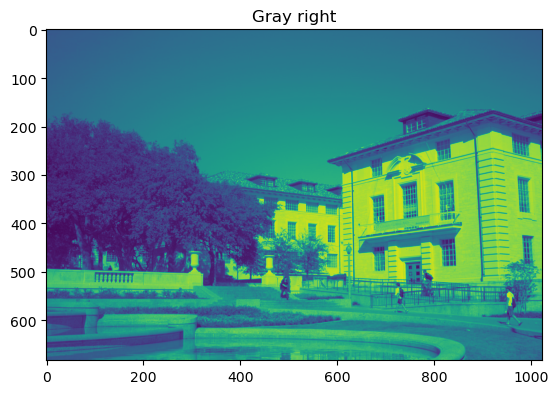

In [17]:
rgb_left = cv2.cvtColor(cv2.imread("../Images/left.jpg"), cv2.COLOR_BGR2RGB)
show_image(rgb_left, "RGB left")

rgb_right = cv2.cvtColor(cv2.imread("../Images/right.jpg"), cv2.COLOR_BGR2RGB)
show_image(rgb_right, "RGB right")

gray_left = cv2.cvtColor(rgb_left, cv2.COLOR_RGB2GRAY)
show_image(gray_left, "Gray left")

gray_right = cv2.cvtColor(rgb_right, cv2.COLOR_RGB2GRAY)
show_image(gray_right, "Gray right")

<h2><b>SIFT feature detection and description</b></h2><br>

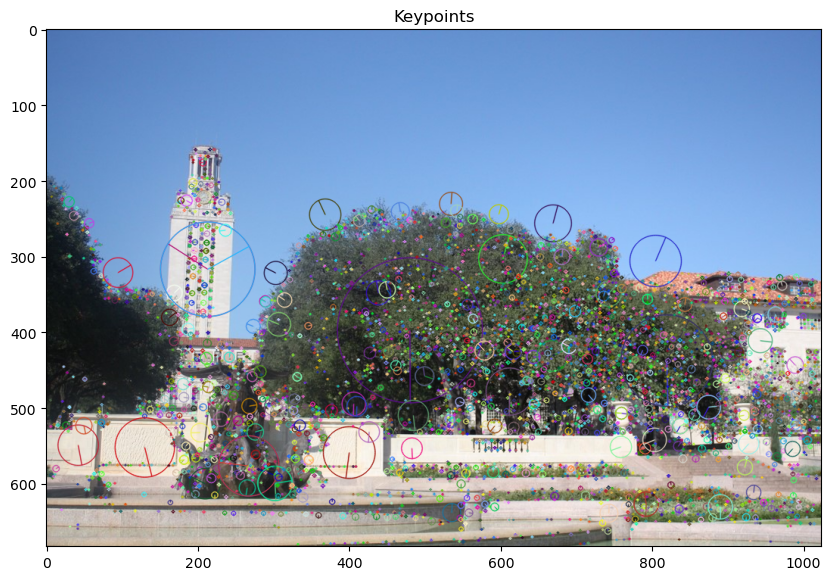

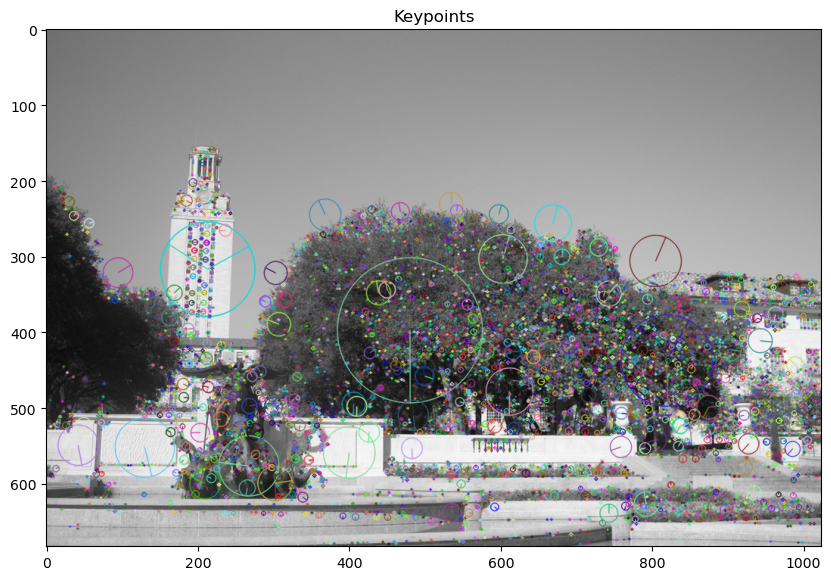

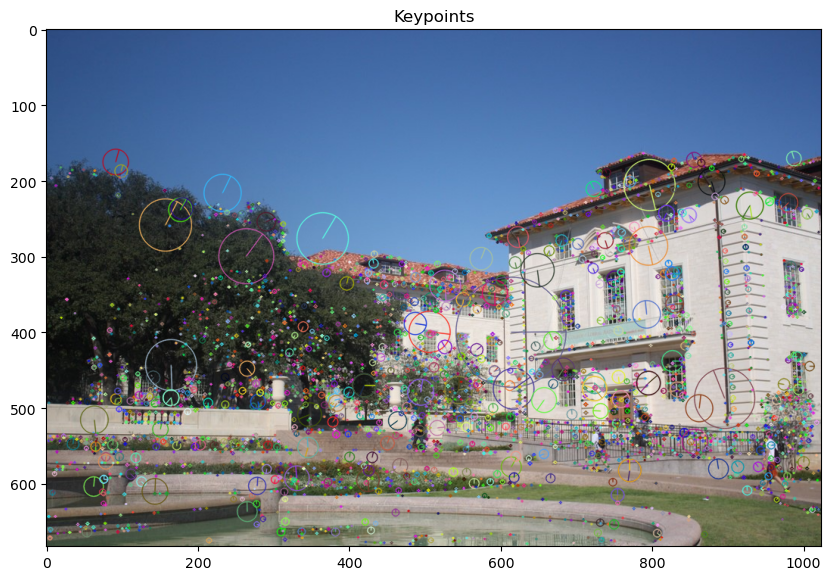

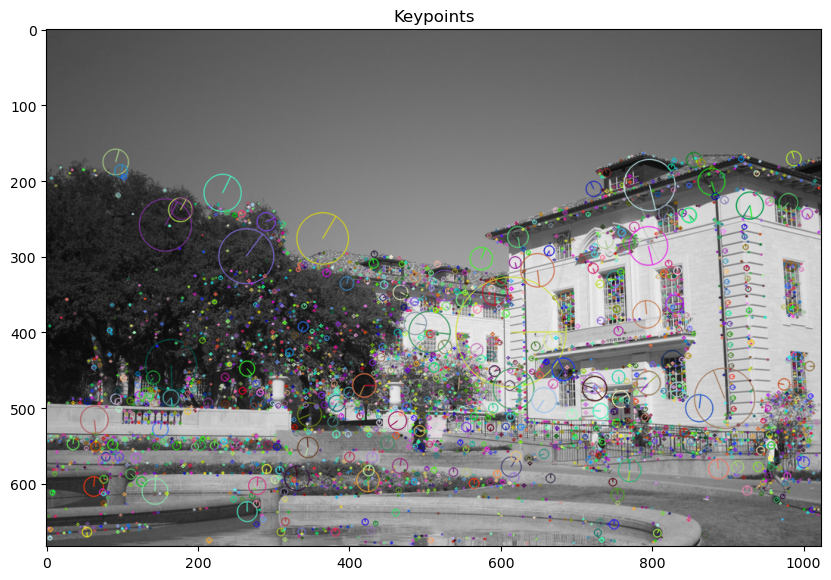

In [23]:
# use orb if sift is not installed
feature_extractor = cv2.SIFT_create()

# find the keypoints and descriptors with chosen feature_extractor
kp_gl, desc_gl = feature_extractor.detectAndCompute(gray_left, None)
kp_gr, desc_gr = feature_extractor.detectAndCompute(gray_right, None)

test = cv2.drawKeypoints(rgb_left, kp_gl, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize = figsize)
show_image(test, "Keypoints")

test = cv2.drawKeypoints(gray_left, kp_gl, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize = figsize)
show_image(test, "Keypoints")

test = cv2.drawKeypoints(rgb_right, kp_gr, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize = figsize)
show_image(test, "Keypoints")

test = cv2.drawKeypoints(gray_right, kp_gr, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize = figsize)
show_image(test, "Keypoints")


<h2><b>Take Only Unique Features</b></h2><br>

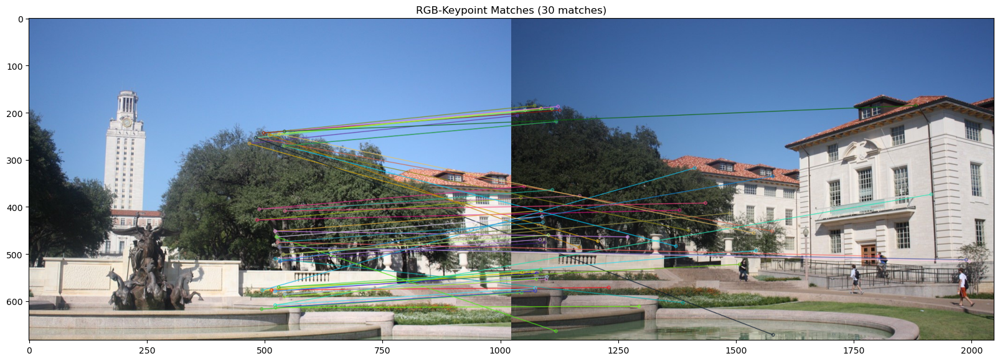

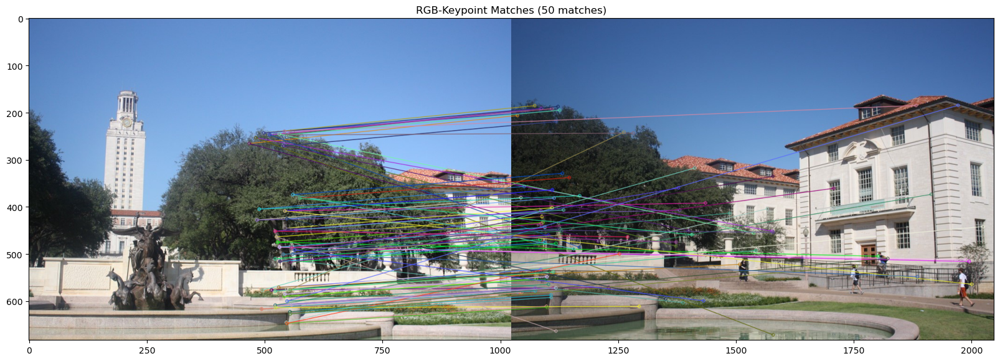

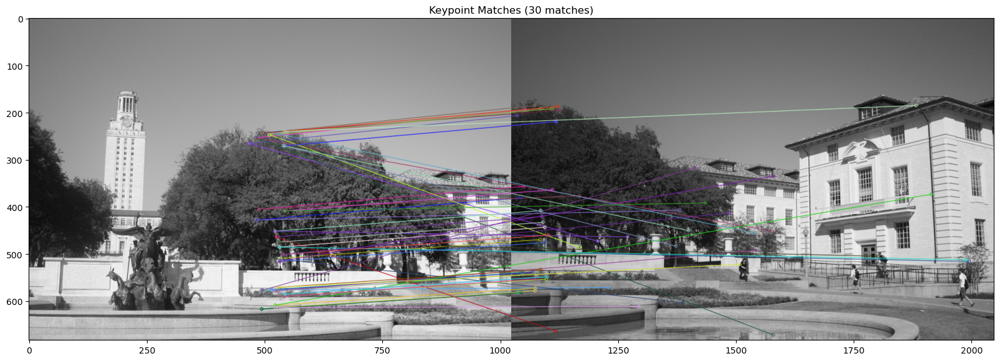

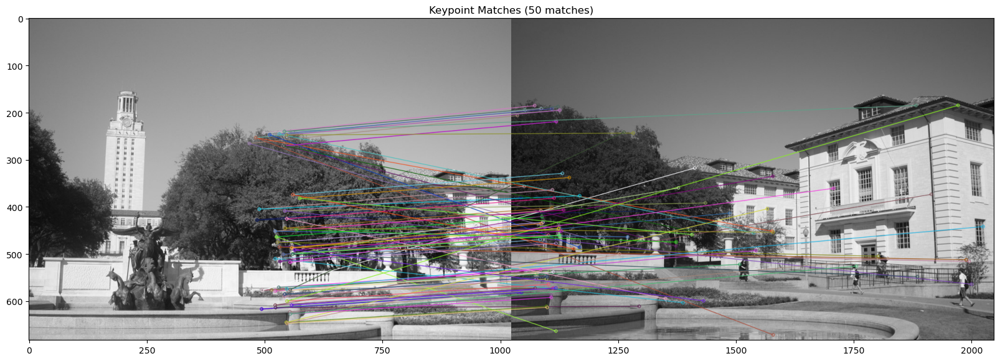

In [38]:
bf = cv2.BFMatcher()
matches = bf.knnMatch(desc_gl, desc_gr, k=2)

# Apply ratio test
good_and_second_good_match_list = []
for m in matches:
    #print(m[0].distance)
    if m[0].distance/m[1].distance < 0.5:
        good_and_second_good_match_list.append(m)
good_match_arr = np.asarray(good_and_second_good_match_list)[:,0]

# show only 30 matches
matches_rgb = cv2.drawMatchesKnn(rgb_left, kp_gl, rgb_right, kp_gr,
                                good_and_second_good_match_list[0:30], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20, 20))
show_image(matches_rgb, "RGB-Keypoint Matches (30 matches)")

# show only 50 matches
matches_rgb = cv2.drawMatchesKnn(rgb_left, kp_gl, rgb_right, kp_gr,
                                good_and_second_good_match_list[0:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20, 20))
show_image(matches_rgb, "RGB-Keypoint Matches (50 matches)")

# show only 30 matches
matches_gray = cv2.drawMatchesKnn(gray_left, kp_gl, gray_right, kp_gr,
                                good_and_second_good_match_list[0:30], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20, 20))
show_image(matches_gray, "Keypoint Matches (30 matches)")

# show only 50 matches
matches_gray = cv2.drawMatchesKnn(gray_left, kp_gl, gray_right, kp_gr,
                                good_and_second_good_match_list[0:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20, 20))
show_image(matches_gray, "Keypoint Matches (50 matches)")


<h2><b>Overlay Images</b></h2><br>

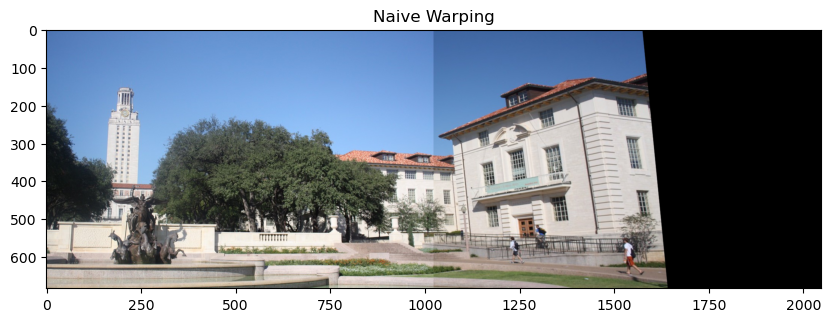

In [49]:
good_kp_l = np.array([kp_gl[m.queryIdx].pt for m in good_match_arr])
good_kp_r = np.array([kp_gr[m.trainIdx].pt for m in good_match_arr])
H, masked = cv2.findHomography(good_kp_r, good_kp_l, cv2.RANSAC, 5.0)

rgb_r_warped = cv2.warpPerspective(rgb_right, H, (rgb_left.shape[1] + rgb_right.shape[1], rgb_left.shape[0]))
rgb_r_warped[0:rgb_left.shape[0], 0:rgb_left.shape[1]] = rgb_left

plt.figure(figsize=figsize)
show_image(rgb_r_warped, "Naive Warping")


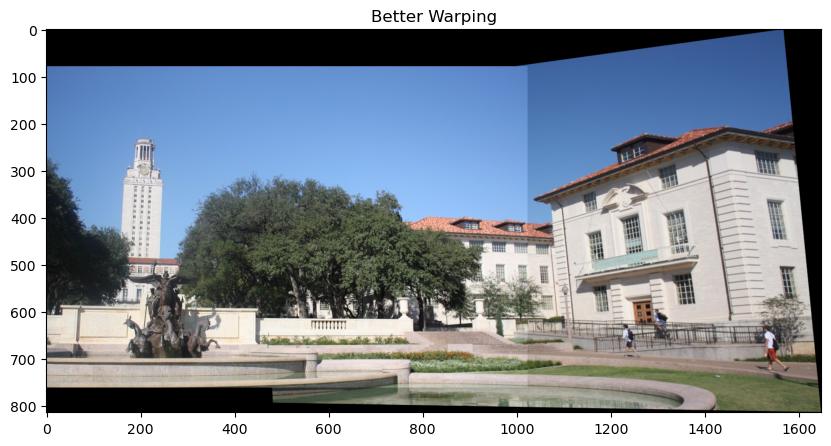

In [51]:
def warpTwoImages(img1, img2, H):
    '''warp img2 to img1 with homograph H
    from: https://stackoverflow.com/questions/13063201/how-to-show-the-whole-image-when-using-opencv-warpperspective
    '''
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    pts1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    pts2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    pts2_ = cv2.perspectiveTransform(pts2, H)
    pts = np.concatenate((pts1, pts2_), axis=0)
    [xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    result = cv2.warpPerspective(img2, Ht@H, (xmax-xmin, ymax-ymin))
    result[t[1]:h1+t[1], t[0]:w1+t[0]] = img1
    return result


result = warpTwoImages(rgb_left, rgb_right, H)

plt.figure(figsize=figsize)
show_image(result, "Better Warping")